In [ ]:
import tensorflow as tf
from keras.models import Sequential,Model
from keras.applications import ResNet50
from keras.layers import Dense,Flatten
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
resnet50=ResNet50(include_top=False,weights='imagenet',input_shape=(32,32,3))

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
from keras.utils import plot_model

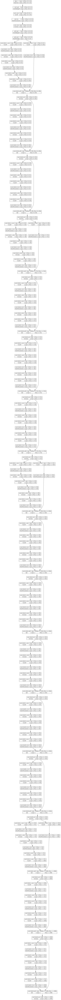

In [ ]:
plot_model(resnet50,show_layer_names=True,show_shapes=True,dpi=100)

In [ ]:
# Flatten output layer of Resnet
flattened=Flatten()(resnet50.output)

# Fully Connected Layer 1
fc1=Dense(128,activation='relu',name='AddedDense1')(flattened)

#Fully connected layer, output layer
fc2=Dense(10,activation='softmax',name='AddedDense2')(fc1)

In [ ]:
model=Model(inputs=resnet50.inputs,outputs=fc2)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 32, 32, 3)]          0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)            0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 16, 16, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 16, 16, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

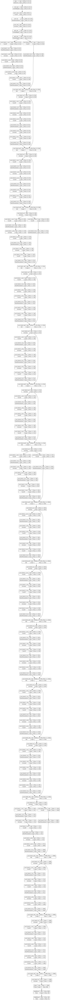

In [ ]:
plot_model(model,show_layer_names=True,show_shapes=True,dpi=100)

In [ ]:
from keras.datasets import cifar10

In [ ]:
(x_train,y_train),(x_test,y_test)=cifar10.load_data()
x_train= x_train.reshape(x_train.shape[0],32,32,3)
x_test= x_test.reshape(x_test.shape[0],32,32,3)

170498071/170498071 [==============================] - 13s 0us/step


In [ ]:
model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
model.fit(x_train,y_train,epochs=10)

Epoch 1/10
1563/1563 [==============================] - 111s 47ms/step - loss: 1.3315 - accuracy: 0.5463
Epoch 2/10
1563/1563 [==============================] - 69s 44ms/step - loss: 1.2061 - accuracy: 0.5883
Epoch 3/10
1563/1563 [==============================] - 70s 45ms/step - loss: 1.1559 - accuracy: 0.6013
Epoch 4/10
1563/1563 [==============================] - 69s 44ms/step - loss: 1.1305 - accuracy: 0.6100
Epoch 5/10
1563/1563 [==============================] - 69s 44ms/step - loss: 0.9955 - accuracy: 0.6571
Epoch 6/10
1563/1563 [==============================] - 70s 45ms/step - loss: 0.9979 - accuracy: 0.6570
Epoch 7/10
1563/1563 [==============================] - 69s 44ms/step - loss: 0.8418 - accuracy: 0.7138
Epoch 8/10
1563/1563 [==============================] - 69s 44ms/step - loss: 0.9076 - accuracy: 0.6905
Epoch 9/10
1563/1563 [==============================] - 71s 46ms/step - loss: 1.0293 - accuracy: 0.6459
Epoch 10/10
1563/1563 [==============================] - 69s 44

In [ ]:
model.evaluate(x_test,y_test,batch_size=1)

10000/10000 [==============================] - 103s 10ms/step - loss: 1.2711 - accuracy: 0.5624


[1.2710695266723633, 0.5623999834060669]

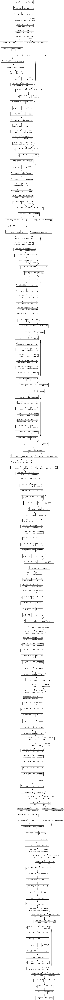

In [ ]:
plot_model(model,dpi=100,show_layer_names=True,show_shapes=True,show_trainable=True)

In [21]:
for layer in model.layers:
  print(layer.trainable,end=' ')

True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True True 

In [22]:
resnet50.trainable=False

In [28]:
model=Model(inputs=resnet50.inputs,outputs=fc2)

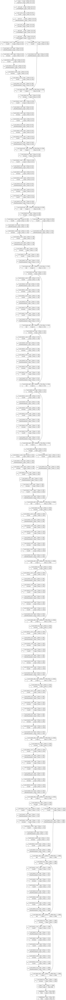

In [29]:
plot_model(model,dpi=100,show_layer_names=True,show_shapes=True,show_trainable=True)

In [30]:
model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [26]:
model.fit(x_train,y_train,epochs=10)

Epoch 1/10
1563/1563 [==============================] - 24s 13ms/step - loss: 1.0356 - accuracy: 0.6403
Epoch 2/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.9992 - accuracy: 0.6512
Epoch 3/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.9824 - accuracy: 0.6552
Epoch 4/10
1563/1563 [==============================] - 18s 12ms/step - loss: 0.9666 - accuracy: 0.6597
Epoch 5/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.9556 - accuracy: 0.6627
Epoch 6/10
1563/1563 [==============================] - 20s 13ms/step - loss: 0.9452 - accuracy: 0.6645
Epoch 7/10
1563/1563 [==============================] - 18s 11ms/step - loss: 0.9481 - accuracy: 0.6690
Epoch 8/10
1563/1563 [==============================] - 17s 11ms/step - loss: 0.9276 - accuracy: 0.6705
Epoch 9/10
1563/1563 [==============================] - 18s 12ms/step - loss: 0.9181 - accuracy: 0.6737
Epoch 10/10
1563/1563 [==============================] - 20s 13m

In [27]:
model.evaluate(x_test,y_test,batch_size=1)

10000/10000 [==============================] - 82s 8ms/step - loss: 1.0970 - accuracy: 0.6245


[1.097048282623291, 0.6244999766349792]

In [31]:
res=ResNet50()

102967424/102967424 [==============================] - 5s 0us/step


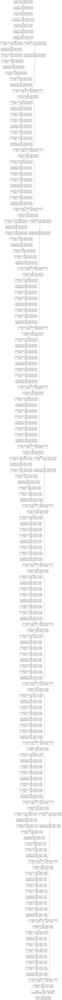

In [32]:
plot_model(res,dpi=100,show_shapes=True)